# Data Preprocessing And Exploratory Data Analysis


Encoding for Gender:
Male -> 1
Female -> 0

Encoding for Father's Education:
MS -> 2
BS -> 0
Matric -> 3
Intermediate -> 1
PhD/ Doctor -> 4

Encoding for Mother's Education:
PhD/ Doctor -> 5
Intermediate -> 2
Matric -> 4
BS -> 0
MS -> 3
Below Matric -> 1

Encoding for guidance:
YES -> 1
NO -> 0

Encoding for  scholarship:
YES -> 1
NO -> 0

Encoding for I opted for this program of study because of my own interest.:
Agree -> 0
Strongly Agree -> 3
Neutral -> 2
Disagree -> 1
Strongly disagree -> 4

Encoding for Basic Education:
Matric -> 1
Cambridge -> 0

Encoding for Intermediate :
FSc/ ICS -> 1
A-Level -> 0

Encoding for  lecture language:
both -> 2
Urdu -> 1
English -> 0

Encoding for lecture mode:
none -> 3
Whiteboard -> 1
both -> 2
Power point -> 0

Encoding for sitting place:
front -> 1
none -> 3
middle -> 2
back -> 0

Encoding for lecture duration:
1 hour -> 0
none -> 2
1.5 hour -> 1

Encoding for number of students:
none -> 3
30 -> 0
40 -> 1
50 -> 2

Encoding for lecture material:

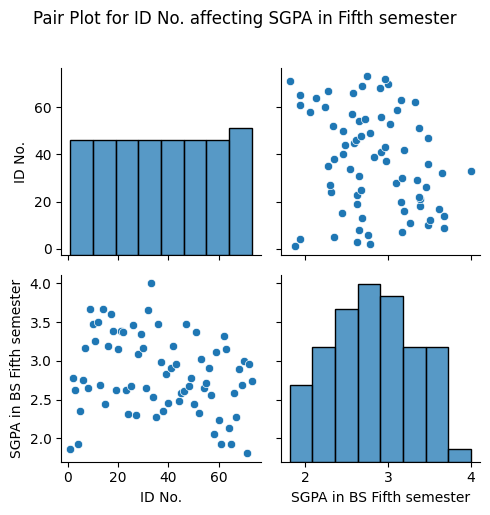

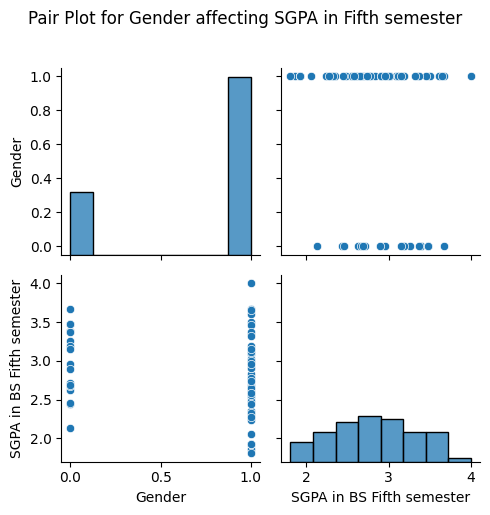

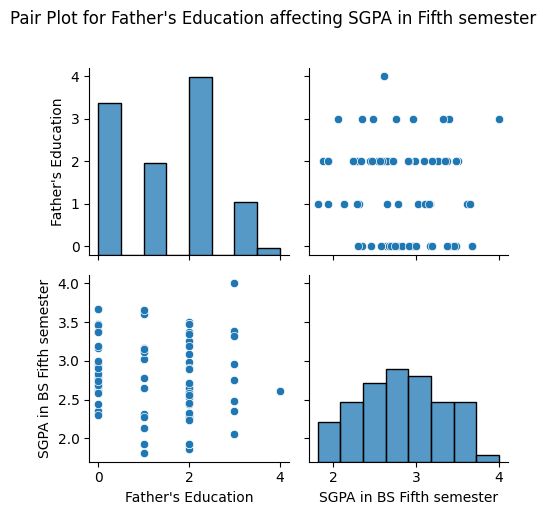

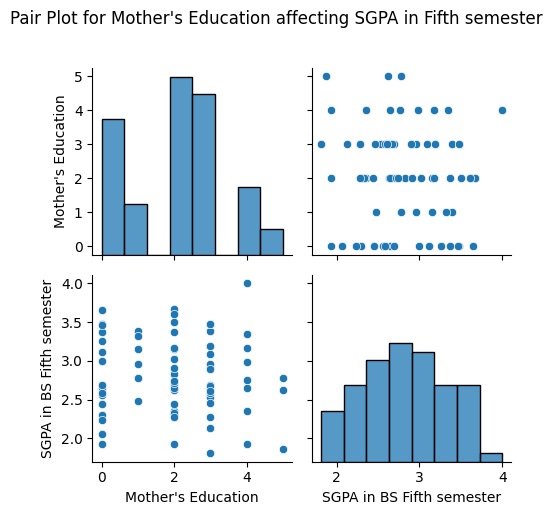

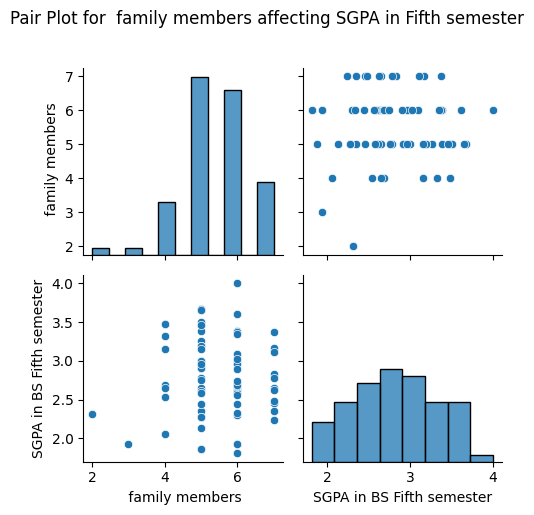

...

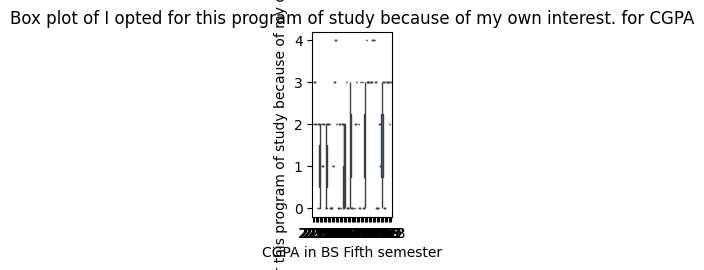

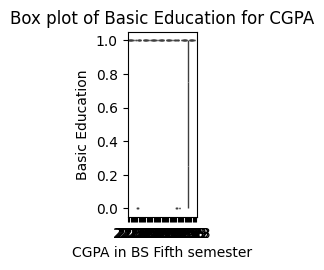

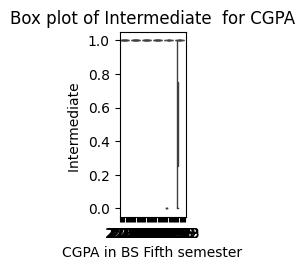

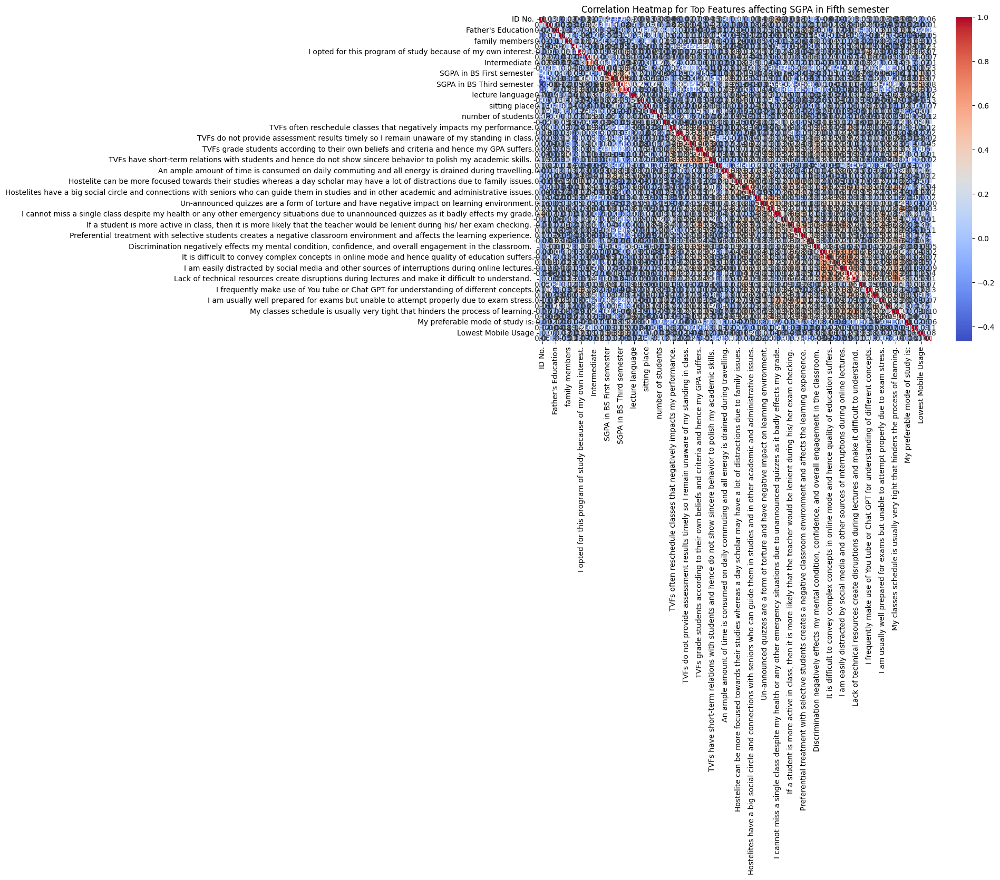

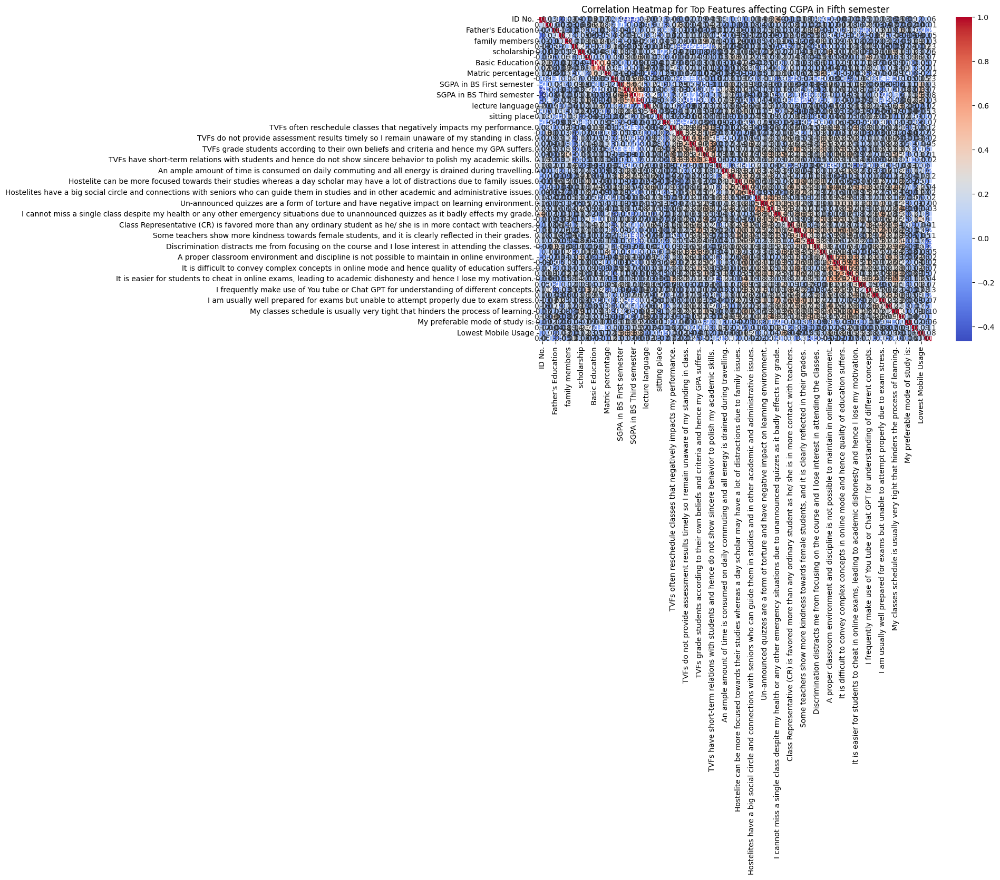

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_regression

# Load the dataset
df = pd.read_csv('updated.csv')

# Handle missing values
df = df.dropna()

# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns

# Encode categorical variables if any and print the mapping
label_encoder = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns:
    original_values = df[col].unique()
    encoded_values = label_encoder.fit_transform(original_values)
    
    print(f"\nEncoding for {col}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} -> {encoded}")
    
    df[col] = label_encoder.transform(df[col])

# Identify features and target variables
features = df.drop(['SGPA in BS Fifth semester', 'CGPA in BS Fifth semester'], axis=1)
target_sgpa = df['SGPA in BS Fifth semester']
target_cgpa = df['CGPA in BS Fifth semester']

# Select top features using SelectKBest and f_regression
num_features = 60
selector_sgpa = SelectKBest(score_func=f_regression, k=num_features)
selector_cgpa = SelectKBest(score_func=f_regression, k=num_features)

X_sgpa = features.copy()
X_cgpa = features.copy()

X_sgpa = X_sgpa.apply(lambda col: label_encoder.fit_transform(col) if col.name in categorical_columns else col)
X_cgpa = X_cgpa.apply(lambda col: label_encoder.fit_transform(col) if col.name in categorical_columns else col)

X_sgpa = selector_sgpa.fit_transform(X_sgpa, target_sgpa)
X_cgpa = selector_cgpa.fit_transform(X_cgpa, target_cgpa)

top_features_sgpa = features.columns[selector_sgpa.get_support()]
top_features_cgpa = features.columns[selector_cgpa.get_support()]

# Print top 25 features
print("Top 25 Features affecting SGPA in Fifth semester:")
print(top_features_sgpa)

print("\nTop 25 Features affecting CGPA in Fifth semester:")
print(top_features_cgpa)

# Visualize relationships with pair plots for SGPA
for i, feature in enumerate(top_features_sgpa):
    sns.pairplot(df[[feature, 'SGPA in BS Fifth semester']])
    plt.suptitle(f'Pair Plot for {feature} affecting SGPA in Fifth semester', y=1.02)
    plt.tight_layout()
    plt.show()

# Visualize relationships with pair plots for CGPA
for j, feature in enumerate(top_features_cgpa):
    sns.pairplot(df[[feature, 'CGPA in BS Fifth semester']])
    plt.suptitle(f'Pair Plot for {feature} affecting CGPA in Fifth semester', y=1.02)
    plt.tight_layout()
    plt.show()

# Visualize relationships with box plots for SGPA
plt.figure(figsize=(16, 8))
for i, feature in enumerate(top_features_sgpa[:min(len(top_features_sgpa), 10)]):
    plt.subplot(2, 5, i+1)
    sns.boxplot(x=target_sgpa, y=df[feature])
    plt.title(f'Box plot of {feature} for SGPA')
    plt.tight_layout()
    plt.show()

# Visualize relationships with box plots for CGPA
plt.figure(figsize=(16, 8))
for i, feature in enumerate(top_features_cgpa[:min(len(top_features_cgpa), 10)]):
    plt.subplot(2, 5, i+1)
    sns.boxplot(x=target_cgpa, y=df[feature])
    plt.title(f'Box plot of {feature} for CGPA')
    plt.tight_layout()
    plt.show()

# Heatmap for correlation matrix SGPA
plt.figure(figsize=(12, 8))
correlation_matrix_sgpa = df[top_features_sgpa].corr()
sns.heatmap(correlation_matrix_sgpa, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap for Top Features affecting SGPA in Fifth semester')
plt.show()

# Heatmap for correlation matrix CGPA
plt.figure(figsize=(12, 8))
correlation_matrix_cgpa = df[top_features_cgpa].corr()
sns.heatmap(correlation_matrix_cgpa, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap for Top Features affecting CGPA in Fifth semester')
plt.show()


# Getting Important Features

In [5]:
# Assuming top_features_sgpa and top_features_cgpa are lists of selected features
selected_features = list(set(top_features_sgpa).union(top_features_cgpa))
print(selected_features) 
# Select only the columns present in selected_features
df_final = df[selected_features + ['SGPA in BS Fifth semester', 'CGPA in BS Fifth semester']]

# Save the final DataFrame to a new CSV file
df_final.to_csv('useful_features.csv', index=False)

['Un-announced quizzes are quite stressful and cause unnecessary anxiety and pressure on students.', 'Preferential treatment with selective students creates a negative classroom environment and affects the learning experience. ', 'SGPA in BS Second semester', 'Gender', 'I opted for this program of study because of my own interest.', 'Due to class/ lab cancellation or roads blockage, lots of time get wasted due to fixed official transport timings.', 'Some teachers show more kindness towards female students, and it is clearly reflected in their grades. ', 'My preferable time of study is:', "Mother's Education", 'Un-announced quizzes are a waste of time and energy and are not effective and productive in the long term.', 'Intermediate percentage', 'Hostelites have better access to campus resources like libraries, instructors, labs and also get benefit of group study. ', 'Lowest Mobile Usage', 'residence place', 'Hostelite can be more focused towards their studies whereas a day scholar may 

# Predictive Models Training And Evaluation


loading completed

Features Selection  completed

Spliting is completed

5 models are Initialized

combining models completed

Training completed

model saving completed
Mean Squared Error for rf: 0.006525361363636461
Mean Squared Error for gb: 0.0037181344666905843
Mean Squared Error for svr: 0.2784451971174641
Mean Squared Error for lr: 0.3888555744301984
Mean Squared Error for rf2: 0.006525361363636461
Mean Squared Error for ensemble: 0.04699171682417322

Model Evaluation completed


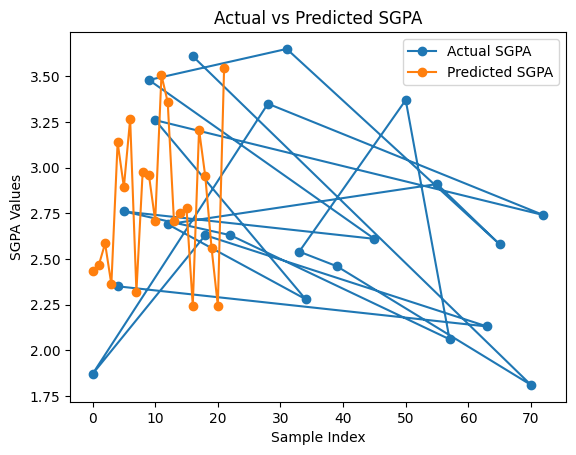

Mean Squared Error: 0.05
Mean Absolute Error: 0.17
R-squared: 0.83


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.svm import SVR  
from sklearn.linear_model import LinearRegression  
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib

# Load the final dataset
df_final = pd.read_csv('useful_features.csv')
print("\nloading completed")

# Define features and target variables
X = df_final[selected_features]  # Replace with your actual feature names
X = df_final.drop('ID No.', axis=1)
y_sgpa = df_final['SGPA in BS Fifth semester']
y_cgpa = df_final['CGPA in BS Fifth semester']
print("\nFeatures Selection  completed")

# Split the data into training and testing sets
X_train, X_test, y_sgpa_train, y_sgpa_test, y_cgpa_train, y_cgpa_test = train_test_split(
    X, y_sgpa, y_cgpa, test_size=0.3, random_state=42
)
print("\nSpliting is completed")

# Initialize five different regressors
rf_regressor = RandomForestRegressor(random_state=42)
gb_regressor = GradientBoostingRegressor(random_state=42)
svr_regressor = SVR()  # Replaced AdaBoostRegressor with SVR
lr_regressor = LinearRegression()  # Replaced BaggingRegressor with LinearRegression
rf_regressor_2 = RandomForestRegressor(random_state=42)  # Additional RandomForestRegressor
print("\n5 models are Initialized")

# Combine models using VotingRegressor
ensemble_regressor = VotingRegressor(estimators=[
    ('rf', rf_regressor),
    ('gb', gb_regressor),
    ('svr', svr_regressor),
    ('lr', lr_regressor),
    ('rf2', rf_regressor_2)
])
print("\ncombining models completed")

# Train the models
rf_regressor.fit(X_train, y_sgpa_train)
gb_regressor.fit(X_train, y_sgpa_train)
svr_regressor.fit(X_train, y_sgpa_train)
lr_regressor.fit(X_train, y_sgpa_train)
rf_regressor_2.fit(X_train, y_sgpa_train)
ensemble_regressor.fit(X_train, y_sgpa_train)
print("\nTraining completed")

# Save the models
models = {
    'rf': rf_regressor,
    'gb': gb_regressor,
    'svr': svr_regressor,
    'lr': lr_regressor,
    'rf2': rf_regressor_2,
    'ensemble': ensemble_regressor
}

for name, model in models.items():
    joblib.dump(model, f'{name}_model.pkl')
print("\nmodel saving completed")

# Evaluate the models
for name, model in models.items():
    y_sgpa_pred = model.predict(X_test)
    mse = mean_squared_error(y_sgpa_test, y_sgpa_pred)
    print(f'Mean Squared Error for {name}: {mse}')
print("\nModel Evaluation completed")

# Now, you can use the models for predictions
# For example, to predict SGPA using the ensemble model:
# Use the test dataset to make predictions
sgpa_prediction_test = ensemble_regressor.predict(X_test)

# Plot actual vs predicted values as a line graph
plt.plot(y_sgpa_test, label='Actual SGPA', marker='o')
plt.plot(sgpa_prediction_test, label='Predicted SGPA', marker='o')
plt.xlabel('Sample Index')
plt.ylabel('SGPA Values')
plt.title('Actual vs Predicted SGPA')
plt.legend()
plt.show()

# Print performance metrics for regression
mse = mean_squared_error(y_sgpa_test, sgpa_prediction_test)
mae = mean_absolute_error(y_sgpa_test, sgpa_prediction_test)
r2 = r2_score(y_sgpa_test, sgpa_prediction_test)

print(f'Mean Squared Error: {mse:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')
print(f'R-squared: {r2:.2f}')


# Evaluation on Test Dataset

In [12]:
# Use the test dataset to make predictions for both SGPA and CGPA
sgpa_prediction_test = gb_regressor.predict(X_test)

# Print the predicted SGPA and CGPA for the first instance in the test set
print(f'Predicted SGPA : {sgpa_prediction_test[0]}')
cgpa_prediction_test = models['ensemble'].estimators_[1].predict(X_test)  # Replace 1 with the index of the CGPA model
print(f'Predicted CGPA : {cgpa_prediction_test[0]}')
print("\n",sgpa_prediction_test[0],"\n",cgpa_prediction_test[0],"\n",X_test)

Predicted SGPA : 2.3500168226821936
Predicted CGPA : 2.3500168226821936

 2.3500168226821936 
 2.3500168226821936 
     Un-announced quizzes are quite stressful and cause unnecessary anxiety and pressure on students.  \
4                                                   3                                                  
63                                                  0                                                  
18                                                  3                                                  
0                                                   2                                                  
28                                                  1                                                  
72                                                  2                                                  
10                                                  3                                                  
34                                                  

In [8]:
# Save testing data to a CSV file
X_test.to_csv('testing_data.csv', index=False)

In [18]:
import pandas as pd
import tkinter as tk
from tkinter import ttk
import joblib
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.svm import SVR  
from sklearn.linear_model import LinearRegression  

# Load the models
models = {
    'rf': joblib.load('rf_model.pkl'),
    'gb': joblib.load('gb_model.pkl'),
    'svr': joblib.load('svr_model.pkl'),
    'lr': joblib.load('lr_model.pkl'),
    'rf2': joblib.load('rf2_model.pkl'),
    'ensemble': joblib.load('ensemble_model.pkl')
}

# Define the GPA conditions
def get_gpa_condition(gpa):
    if 3.51 <= gpa <= 4.00:
        return "Extraordinary Performance"
    elif 3.00 <= gpa <= 3.50:
        return "Very Good Performance"
    elif 2.51 <= gpa <= 2.99:
        return "Good Performance"
    elif 2.00 <= gpa <= 2.50:
        return "Satisfactory Performance"
    elif 1.00 <= gpa <= 1.99:
        return "Poor Performance"
    elif 0.00 <= gpa <= 0.99:
        return "Very Poor Performance"
    else:
        return "Invalid GPA"

# Define the prediction function
def predict_gpa(selected_model, sgpa_first, sgpa_third):
    input_data = pd.DataFrame({'SGPA in BS First semester': [sgpa_first],
                                'SGPA in BS Third semester': [sgpa_third]})
    
    # Use the selected model for prediction
    model = models[selected_model]
    predicted_sgpa = model.predict(input_data)
    
    # Display predicted SGPA
    predicted_output.set(f'Predicted SGPA: {predicted_sgpa[0]:.2f}')
    
    # Calculate CGPA (for demonstration purposes, adjust accordingly based on your actual calculation)
    predicted_cgpa = predicted_sgpa * 2.5  # Adjust the multiplier based on your CGPA calculation
    
    # Display predicted CGPA
    predicted_cgpa_output.set(f'Predicted CGPA: {predicted_cgpa[0]:.2f}')
    
    # Display GPA condition for SGPA
    condition_output_sgpa.set(f'SGPA Condition: {get_gpa_condition(predicted_sgpa[0])}')

# Create the main window
root = tk.Tk()
root.title("GPA Prediction GUI")

# Create input fields
label_sgpa_first = ttk.Label(root, text="SGPA in BS First semester:")
label_sgpa_first.grid(row=0, column=0, padx=10, pady=10)

entry_sgpa_first = ttk.Entry(root)
entry_sgpa_first.grid(row=0, column=1, padx=10, pady=10)

label_sgpa_third = ttk.Label(root, text="SGPA in BS Third semester:")
label_sgpa_third.grid(row=1, column=0, padx=10, pady=10)

entry_sgpa_third = ttk.Entry(root)
entry_sgpa_third.grid(row=1, column=1, padx=10, pady=10)

# Create dropdown for model selection
label_model = ttk.Label(root, text="Select Model:")
label_model.grid(row=2, column=0, padx=10, pady=10)

selected_model = tk.StringVar()
model_choices = list(models.keys())
dropdown_model = ttk.Combobox(root, textvariable=selected_model, values=model_choices)
dropdown_model.grid(row=2, column=1, padx=10, pady=10)
dropdown_model.set(model_choices[0])

# Create button to trigger prediction
predict_button = ttk.Button(root, text="Predict", command=lambda: predict_gpa(selected_model.get(),
                                                                             float(entry_sgpa_first.get()),
                                                                             float(entry_sgpa_third.get())))
predict_button.grid(row=3, column=0, columnspan=2, pady=10)

# Create output labels
predicted_output = tk.StringVar()
predicted_cgpa_output = tk.StringVar()
condition_output_sgpa = tk.StringVar()

label_predicted_output = ttk.Label(root, textvariable=predicted_output)
label_predicted_output.grid(row=4, column=0, columnspan=2, pady=10)

label_predicted_cgpa_output = ttk.Label(root, textvariable=predicted_cgpa_output)
label_predicted_cgpa_output.grid(row=5, column=0, columnspan=2, pady=10)

label_condition_output_sgpa = ttk.Label(root, textvariable=condition_output_sgpa)
label_condition_output_sgpa.grid(row=6, column=0, columnspan=2, pady=10)

# Run the GUI
root.mainloop()


Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.2032.0_x64__qbz5n2kfra8p0\Lib\tkinter\__init__.py", line 1948, in __call__
    return self.func(*args)
           ^^^^^^^^^^^^^^^^
  File "C:\Users\mujta\AppData\Local\Temp\ipykernel_20556\2668710521.py", line 85, in <lambda>
    predict_button = ttk.Button(root, text="Predict", command=lambda: predict_gpa(selected_model.get(),
                                                                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\mujta\AppData\Local\Temp\ipykernel_20556\2668710521.py", line 43, in predict_gpa
    predicted_sgpa = model.predict(input_data)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\mujta\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\ensemble\_forest.py", line 981, in predict
    X = self._validate_X_predict